<a href="https://colab.research.google.com/github/fergalriordan/CycleGAN_D2N/blob/main/D2N.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!pip install tensorflow_addons

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 612.1/612.1 kB 8.3 MB/s eta 0:00:00


In [2]:
import tensorflow as tf

import matplotlib.pyplot as plt
import numpy as np

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers

import tensorflow_addons as tfa

/usr/local/lib/python3.10/dist-packages/tensorflow_addons/utils/tfa_eol_msg.py:23: UserWarning: 

TensorFlow Addons (TFA) has ended development and introduction of new features.
TFA has entered a minimal maintenance and release mode until a planned end of life in May 2024.
Please modify downstream libraries to take dependencies from other repositories in our TensorFlow community (e.g. Keras, Keras-CV, and Keras-NLP). 

For more information see: https://github.com/tensorflow/addons/issues/2807 

  warnings.warn(


In [56]:
# Define the paths to your 'day' and 'night' image folders.
day_path = "day"
night_path = "night"

input_img_size = (256, 256, 3)

# Load the images.
day_images = tf.data.Dataset.list_files(day_path + '/*.jpg')
night_images = tf.data.Dataset.list_files(night_path + '/*.jpg')

def normalize_img(img):
    img = tf.cast(img, dtype=tf.float32)
    # Map values in the range [-1, 1]
    return (img / 127.5) - 1.0

# Define buffer size and batch size
buffer_size = 64
batch_size = 1

# Autotune for parallel processing
autotune = tf.data.AUTOTUNE

# Define preprocessing functions
def preprocess_train_image(img, label):
    # Random flip
    img = tf.image.random_flip_left_right(img)
    # Resize to the original size first
    img = tf.image.resize(img, [input_img_size[0], input_img_size[1]])
    # Random crop to 256x256
    img = tf.image.random_crop(img, size=[input_img_size[0], input_img_size[1], input_img_size[2]])
    # Normalize the pixel values in the range [-1, 1]
    img = normalize_img(img)
    return img

def preprocess_test_image(img, label):
    # Resize and normalize for test images
    img = tf.image.resize(img, [input_img_size[0], input_img_size[1]])
    img = normalize_img(img)
    return img


In [57]:
# Split day dataset into training and test sets
total_day_samples = len(list(day_images))
train_day_size = int(total_day_samples - 10)

day_train_dataset = (day_images
    .shuffle(buffer_size)
    .take(train_day_size)
    .map(lambda x: (tf.image.decode_jpeg(tf.io.read_file(x)), 0), num_parallel_calls=autotune)
    .map(preprocess_train_image, num_parallel_calls=autotune)
    .cache()
    .batch(batch_size)
)

day_test_dataset = (day_images
    .skip(train_day_size)
    .map(lambda x: (tf.image.decode_jpeg(tf.io.read_file(x)), 0), num_parallel_calls=autotune)
    .map(preprocess_test_image, num_parallel_calls=autotune)
    .cache()
    .batch(batch_size)
)

# Split night dataset into training and test sets
total_night_samples = len(list(night_images))
#train_night_size = int(0.8 * total_night_samples)

night_train_dataset = (night_images
    .shuffle(buffer_size)
    #.take(train_night_size)
    .take(total_night_samples)
    .map(lambda x: (tf.image.decode_jpeg(tf.io.read_file(x)), 1), num_parallel_calls=autotune)
    .map(preprocess_train_image, num_parallel_calls=autotune)
    .cache()
    .batch(batch_size)
)

night_test_dataset = (night_images
    .skip(train_night_size)
    .map(lambda x: (tf.image.decode_jpeg(tf.io.read_file(x)), 1), num_parallel_calls=autotune)
    .map(preprocess_test_image, num_parallel_calls=autotune)
    .cache()
    .batch(batch_size)
)

# Now you have day_train_dataset, day_test_dataset, night_train_dataset, and night_test_dataset

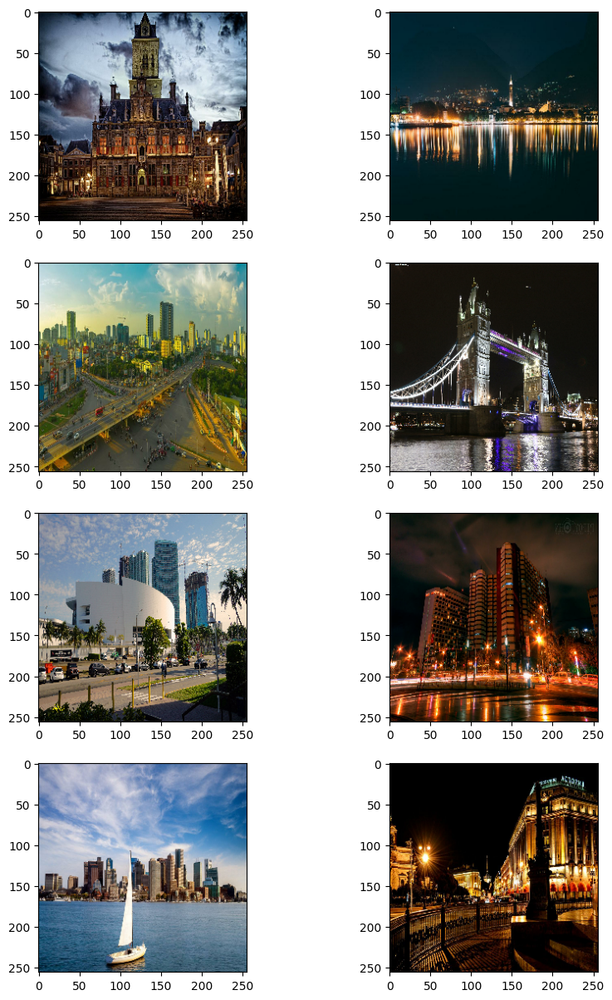

In [58]:
_, ax = plt.subplots(4, 2, figsize=(10, 15))
for i, samples in enumerate(zip(day_train_dataset.take(4), night_train_dataset.take(4))):
    day = (((samples[0][0] * 127.5) + 127.5).numpy()).astype(np.uint8)
    night = (((samples[1][0] * 127.5) + 127.5).numpy()).astype(np.uint8)
    ax[i, 0].imshow(day)
    ax[i, 1].imshow(night)
plt.show()

In [59]:
# Weights initializer for the layers.
kernel_init = keras.initializers.RandomNormal(mean=0.0, stddev=0.02)
# Gamma initializer for instance normalization.
gamma_init = keras.initializers.RandomNormal(mean=0.0, stddev=0.02)

class ReflectionPadding2D(layers.Layer):
    """Implements Reflection Padding as a layer.

    Args:
        padding(tuple): Amount of padding for the
        spatial dimensions.

    Returns:
        A padded tensor with the same type as the input tensor.
    """

    def __init__(self, padding=(1, 1), **kwargs):
        self.padding = tuple(padding)
        super().__init__(**kwargs)

    def call(self, input_tensor, mask=None):
        padding_width, padding_height = self.padding
        padding_tensor = [
            [0, 0],
            [padding_height, padding_height],
            [padding_width, padding_width],
            [0, 0],
        ]
        return tf.pad(input_tensor, padding_tensor, mode="REFLECT")


def residual_block(
    x,
    activation,
    kernel_initializer=kernel_init,
    kernel_size=(3, 3),
    strides=(1, 1),
    padding="valid",
    gamma_initializer=gamma_init,
    use_bias=False,
):
    dim = x.shape[-1]
    input_tensor = x

    x = ReflectionPadding2D()(input_tensor)
    x = layers.Conv2D(
        dim,
        kernel_size,
        strides=strides,
        kernel_initializer=kernel_initializer,
        padding=padding,
        use_bias=use_bias,
    )(x)
    x = tfa.layers.InstanceNormalization(gamma_initializer=gamma_initializer)(x)
    x = activation(x)

    x = ReflectionPadding2D()(x)
    x = layers.Conv2D(
        dim,
        kernel_size,
        strides=strides,
        kernel_initializer=kernel_initializer,
        padding=padding,
        use_bias=use_bias,
    )(x)
    x = tfa.layers.InstanceNormalization(gamma_initializer=gamma_initializer)(x)
    x = layers.add([input_tensor, x])
    return x


def downsample(
    x,
    filters,
    activation,
    kernel_initializer=kernel_init,
    kernel_size=(3, 3),
    strides=(2, 2),
    padding="same",
    gamma_initializer=gamma_init,
    use_bias=False,
):
    x = layers.Conv2D(
        filters,
        kernel_size,
        strides=strides,
        kernel_initializer=kernel_initializer,
        padding=padding,
        use_bias=use_bias,
    )(x)
    x = tfa.layers.InstanceNormalization(gamma_initializer=gamma_initializer)(x)
    if activation:
        x = activation(x)
    return x


def upsample(
    x,
    filters,
    activation,
    kernel_size=(3, 3),
    strides=(2, 2),
    padding="same",
    kernel_initializer=kernel_init,
    gamma_initializer=gamma_init,
    use_bias=False,
):
    x = layers.Conv2DTranspose(
        filters,
        kernel_size,
        strides=strides,
        padding=padding,
        kernel_initializer=kernel_initializer,
        use_bias=use_bias,
    )(x)
    x = tfa.layers.InstanceNormalization(gamma_initializer=gamma_initializer)(x)
    if activation:
        x = activation(x)
    return x

In [60]:
def get_resnet_generator(
    filters=64,
    num_downsampling_blocks=2,
    num_residual_blocks=9,
    num_upsample_blocks=2,
    gamma_initializer=gamma_init,
    name=None,
):
    img_input = layers.Input(shape=input_img_size, name=name + "_img_input")
    x = ReflectionPadding2D(padding=(3, 3))(img_input)
    x = layers.Conv2D(filters, (7, 7), kernel_initializer=kernel_init, use_bias=False)(
        x
    )
    x = tfa.layers.InstanceNormalization(gamma_initializer=gamma_initializer)(x)
    x = layers.Activation("relu")(x)

    # Downsampling
    for _ in range(num_downsampling_blocks):
        filters *= 2
        x = downsample(x, filters=filters, activation=layers.Activation("relu"))

    # Residual blocks
    for _ in range(num_residual_blocks):
        x = residual_block(x, activation=layers.Activation("relu"))

    # Upsampling
    for _ in range(num_upsample_blocks):
        filters //= 2
        x = upsample(x, filters, activation=layers.Activation("relu"))

    # Final block
    x = ReflectionPadding2D(padding=(3, 3))(x)
    x = layers.Conv2D(3, (7, 7), padding="valid")(x)
    x = layers.Activation("tanh")(x)

    model = keras.models.Model(img_input, x, name=name)
    return model

In [61]:
#import tensorflow_addons as tfa

def get_discriminator(
    filters=64, kernel_initializer=kernel_init, num_downsampling=3, name=None
):
    img_input = layers.Input(shape=input_img_size, name=name + "_img_input")
    x = layers.Conv2D(
        filters,
        (4, 4),
        strides=(2, 2),
        padding="same",
        kernel_initializer=kernel_initializer,
    )(img_input)
    x = layers.LeakyReLU(0.2)(x)

    num_filters = filters
    for num_downsample_block in range(3):
        num_filters *= 2
        if num_downsample_block < 2:
            x = downsample(
                x,
                filters=num_filters,
                activation=layers.LeakyReLU(0.2),
                kernel_size=(4, 4),
                strides=(2, 2),
            )
        else:
            x = downsample(
                x,
                filters=num_filters,
                activation=layers.LeakyReLU(0.2),
                kernel_size=(4, 4),
                strides=(1, 1),
            )

    x = layers.Conv2D(
        1, (4, 4), strides=(1, 1), padding="same", kernel_initializer=kernel_initializer
    )(x)

    model = keras.models.Model(inputs=img_input, outputs=x, name=name)
    return model


# Get the generators
gen_G = get_resnet_generator(name="generator_G")
gen_F = get_resnet_generator(name="generator_F")

# Get the discriminators
disc_X = get_discriminator(name="discriminator_X")
disc_Y = get_discriminator(name="discriminator_Y")

In [62]:
class CycleGan(keras.Model):
    def __init__(
        self,
        generator_G,
        generator_F,
        discriminator_X,
        discriminator_Y,
        lambda_cycle=10.0,
        lambda_identity=0.5,
    ):
        super().__init__()
        self.gen_G = generator_G
        self.gen_F = generator_F
        self.disc_X = discriminator_X
        self.disc_Y = discriminator_Y
        self.lambda_cycle = lambda_cycle
        self.lambda_identity = lambda_identity

    def compile(
        self,
        gen_G_optimizer,
        gen_F_optimizer,
        disc_X_optimizer,
        disc_Y_optimizer,
        gen_loss_fn,
        disc_loss_fn,
    ):
        super().compile()
        self.gen_G_optimizer = gen_G_optimizer
        self.gen_F_optimizer = gen_F_optimizer
        self.disc_X_optimizer = disc_X_optimizer
        self.disc_Y_optimizer = disc_Y_optimizer
        self.generator_loss_fn = gen_loss_fn
        self.discriminator_loss_fn = disc_loss_fn
        self.cycle_loss_fn = keras.losses.MeanAbsoluteError()
        self.identity_loss_fn = keras.losses.MeanAbsoluteError()

    def train_step(self, batch_data):
        # x is Horse and y is zebra
        real_x, real_y = batch_data

        # For CycleGAN, we need to calculate different
        # kinds of losses for the generators and discriminators.
        # We will perform the following steps here:
        #
        # 1. Pass real images through the generators and get the generated images
        # 2. Pass the generated images back to the generators to check if we
        #    can predict the original image from the generated image.
        # 3. Do an identity mapping of the real images using the generators.
        # 4. Pass the generated images in 1) to the corresponding discriminators.
        # 5. Calculate the generators total loss (adversarial + cycle + identity)
        # 6. Calculate the discriminators loss
        # 7. Update the weights of the generators
        # 8. Update the weights of the discriminators
        # 9. Return the losses in a dictionary

        with tf.GradientTape(persistent=True) as tape:
            # Horse to fake zebra
            fake_y = self.gen_G(real_x, training=True)
            # Zebra to fake horse -> y2x
            fake_x = self.gen_F(real_y, training=True)

            # Cycle (Horse to fake zebra to fake horse): x -> y -> x
            cycled_x = self.gen_F(fake_y, training=True)
            # Cycle (Zebra to fake horse to fake zebra) y -> x -> y
            cycled_y = self.gen_G(fake_x, training=True)

            # Identity mapping
            same_x = self.gen_F(real_x, training=True)
            same_y = self.gen_G(real_y, training=True)

            # Discriminator output
            disc_real_x = self.disc_X(real_x, training=True)
            disc_fake_x = self.disc_X(fake_x, training=True)

            disc_real_y = self.disc_Y(real_y, training=True)
            disc_fake_y = self.disc_Y(fake_y, training=True)

            # Generator adversarial loss
            gen_G_loss = self.generator_loss_fn(disc_fake_y)
            gen_F_loss = self.generator_loss_fn(disc_fake_x)

            # Generator cycle loss
            cycle_loss_G = self.cycle_loss_fn(real_y, cycled_y) * self.lambda_cycle
            cycle_loss_F = self.cycle_loss_fn(real_x, cycled_x) * self.lambda_cycle

            # Generator identity loss
            id_loss_G = (
                self.identity_loss_fn(real_y, same_y)
                * self.lambda_cycle
                * self.lambda_identity
            )
            id_loss_F = (
                self.identity_loss_fn(real_x, same_x)
                * self.lambda_cycle
                * self.lambda_identity
            )

            # Total generator loss
            total_loss_G = gen_G_loss + cycle_loss_G + id_loss_G
            total_loss_F = gen_F_loss + cycle_loss_F + id_loss_F

            # Discriminator loss
            disc_X_loss = self.discriminator_loss_fn(disc_real_x, disc_fake_x)
            disc_Y_loss = self.discriminator_loss_fn(disc_real_y, disc_fake_y)

        # Get the gradients for the generators
        grads_G = tape.gradient(total_loss_G, self.gen_G.trainable_variables)
        grads_F = tape.gradient(total_loss_F, self.gen_F.trainable_variables)

        # Get the gradients for the discriminators
        disc_X_grads = tape.gradient(disc_X_loss, self.disc_X.trainable_variables)
        disc_Y_grads = tape.gradient(disc_Y_loss, self.disc_Y.trainable_variables)

        # Update the weights of the generators
        self.gen_G_optimizer.apply_gradients(
            zip(grads_G, self.gen_G.trainable_variables)
        )
        self.gen_F_optimizer.apply_gradients(
            zip(grads_F, self.gen_F.trainable_variables)
        )

        # Update the weights of the discriminators
        self.disc_X_optimizer.apply_gradients(
            zip(disc_X_grads, self.disc_X.trainable_variables)
        )
        self.disc_Y_optimizer.apply_gradients(
            zip(disc_Y_grads, self.disc_Y.trainable_variables)
        )

        return {
            "G_loss": total_loss_G,
            "F_loss": total_loss_F,
            "D_X_loss": disc_X_loss,
            "D_Y_loss": disc_Y_loss,
        }

In [65]:
class GANMonitor(keras.callbacks.Callback):
    """A callback to generate and save images after each epoch"""

    def __init__(self, num_img=10):
        self.num_img = num_img

    def on_epoch_end(self, epoch, logs=None):
        if (epoch+1) % 20 == 0:
          _, ax = plt.subplots(10, 2, figsize=(5,25))
          for i, img in enumerate(day_test_dataset.take(self.num_img)):
            prediction = self.model.gen_G(img)[0].numpy()
            prediction = (prediction * 127.5 + 127.5).astype(np.uint8)
            img = (img[0] * 127.5 + 127.5).numpy().astype(np.uint8)

            ax[i, 0].imshow(img)
            ax[i, 1].imshow(prediction)
            ax[i, 0].set_title("Input image")
            ax[i, 1].set_title("Translated image")
            ax[i, 0].axis("off")
            ax[i, 1].axis("off")

          plt.show()
          plt.close()


Epoch 1/200
227/227 [==============================] - 118s 223ms/step - G_loss: 3.4428 - F_loss: 5.0185 - D_X_loss: 0.0681 - D_Y_loss: 0.0997
Epoch 2/200
227/227 [==============================] - 51s 223ms/step - G_loss: 3.3754 - F_loss: 4.8961 - D_X_loss: 0.1165 - D_Y_loss: 0.1301
Epoch 3/200
227/227 [==============================] - 51s 223ms/step - G_loss: 3.3229 - F_loss: 4.8600 - D_X_loss: 0.1065 - D_Y_loss: 0.1415
Epoch 4/200
227/227 [==============================] - 51s 223ms/step - G_loss: 3.4023 - F_loss: 4.9829 - D_X_loss: 0.0993 - D_Y_loss: 0.1263
Epoch 5/200
227/227 [==============================] - 51s 223ms/step - G_loss: 3.1627 - F_loss: 4.9078 - D_X_loss: 0.1197 - D_Y_loss: 0.2023
Epoch 6/200
227/227 [==============================] - 51s 223ms/step - G_loss: 3.1453 - F_loss: 4.5193 - D_X_loss: 0.1717 - D_Y_loss: 0.1696
Epoch 7/200
227/227 [==============================] - 51s 224ms/step - G_loss: 3.1647 - F_loss: 4.5160 - D_X_loss: 0.1641 - D_Y_loss: 0.1824
Epoch

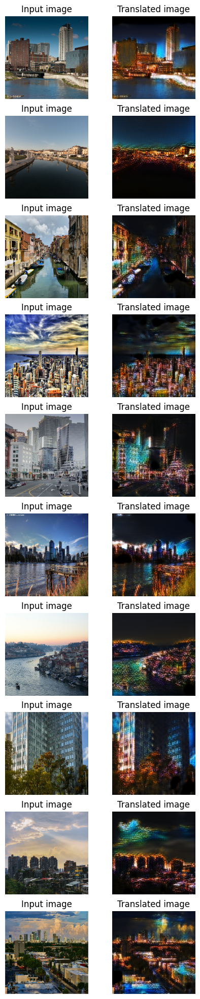

227/227 [==============================] - 53s 235ms/step - G_loss: 2.4861 - F_loss: 4.0136 - D_X_loss: 0.1971 - D_Y_loss: 0.2356
Epoch 21/200
227/227 [==============================] - 51s 223ms/step - G_loss: 2.4847 - F_loss: 4.0079 - D_X_loss: 0.2062 - D_Y_loss: 0.2377
Epoch 22/200
227/227 [==============================] - 51s 223ms/step - G_loss: 2.4594 - F_loss: 3.8398 - D_X_loss: 0.2123 - D_Y_loss: 0.2325
Epoch 23/200
227/227 [==============================] - 51s 224ms/step - G_loss: 2.4193 - F_loss: 3.7944 - D_X_loss: 0.2109 - D_Y_loss: 0.2340
Epoch 24/200
227/227 [==============================] - 51s 224ms/step - G_loss: 2.3389 - F_loss: 3.8364 - D_X_loss: 0.2070 - D_Y_loss: 0.2384
Epoch 25/200
227/227 [==============================] - 51s 224ms/step - G_loss: 2.3078 - F_loss: 3.8242 - D_X_loss: 0.2072 - D_Y_loss: 0.2375
Epoch 26/200
227/227 [==============================] - 51s 224ms/step - G_loss: 2.3258 - F_loss: 3.8527 - D_X_loss: 0.2111 - D_Y_loss: 0.2401
Epoch 27/200

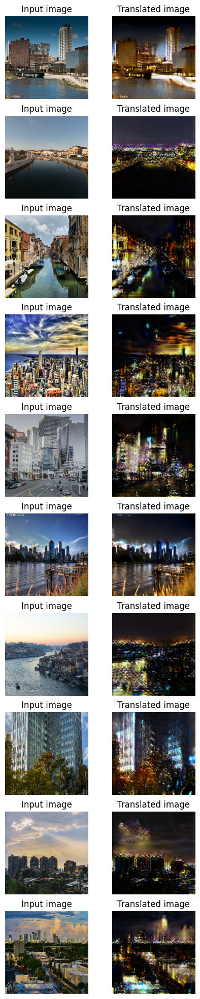

227/227 [==============================] - 54s 236ms/step - G_loss: 2.2204 - F_loss: 3.6271 - D_X_loss: 0.2049 - D_Y_loss: 0.2228
Epoch 41/200
227/227 [==============================] - 51s 224ms/step - G_loss: 2.1703 - F_loss: 3.6152 - D_X_loss: 0.2028 - D_Y_loss: 0.2299
Epoch 42/200
227/227 [==============================] - 51s 224ms/step - G_loss: 2.2263 - F_loss: 3.5985 - D_X_loss: 0.1975 - D_Y_loss: 0.2219
Epoch 43/200
227/227 [==============================] - 51s 224ms/step - G_loss: 2.1998 - F_loss: 3.5666 - D_X_loss: 0.2038 - D_Y_loss: 0.2259
Epoch 44/200
227/227 [==============================] - 51s 223ms/step - G_loss: 2.1775 - F_loss: 3.5920 - D_X_loss: 0.2008 - D_Y_loss: 0.2268
Epoch 45/200
227/227 [==============================] - 51s 224ms/step - G_loss: 2.2247 - F_loss: 3.6582 - D_X_loss: 0.2097 - D_Y_loss: 0.2216
Epoch 46/200
227/227 [==============================] - 51s 224ms/step - G_loss: 2.2350 - F_loss: 3.5768 - D_X_loss: 0.2056 - D_Y_loss: 0.2121
Epoch 47/200

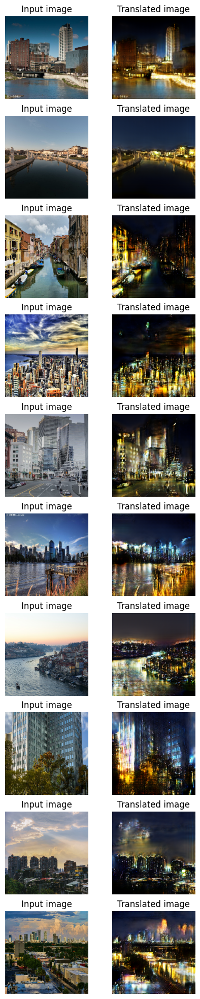

227/227 [==============================] - 54s 236ms/step - G_loss: 2.1865 - F_loss: 3.3963 - D_X_loss: 0.2097 - D_Y_loss: 0.1857
Epoch 61/200
227/227 [==============================] - 51s 224ms/step - G_loss: 2.1825 - F_loss: 3.3535 - D_X_loss: 0.2132 - D_Y_loss: 0.1817
Epoch 62/200
227/227 [==============================] - 51s 223ms/step - G_loss: 2.2249 - F_loss: 3.4844 - D_X_loss: 0.2133 - D_Y_loss: 0.1807
Epoch 63/200
227/227 [==============================] - 51s 225ms/step - G_loss: 2.2434 - F_loss: 3.3912 - D_X_loss: 0.2132 - D_Y_loss: 0.1701
Epoch 64/200
227/227 [==============================] - 51s 224ms/step - G_loss: 2.2076 - F_loss: 3.3796 - D_X_loss: 0.2119 - D_Y_loss: 0.1685
Epoch 65/200
227/227 [==============================] - 51s 224ms/step - G_loss: 2.2148 - F_loss: 3.3205 - D_X_loss: 0.2172 - D_Y_loss: 0.1673
Epoch 66/200
227/227 [==============================] - 51s 223ms/step - G_loss: 2.2904 - F_loss: 3.2934 - D_X_loss: 0.2189 - D_Y_loss: 0.1637
Epoch 67/200

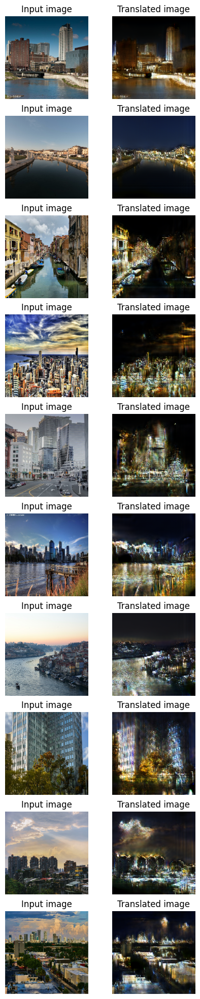

227/227 [==============================] - 53s 235ms/step - G_loss: 2.3989 - F_loss: 3.3320 - D_X_loss: 0.2148 - D_Y_loss: 0.1268
Epoch 81/200
227/227 [==============================] - 51s 223ms/step - G_loss: 2.4062 - F_loss: 3.3247 - D_X_loss: 0.2189 - D_Y_loss: 0.1232
Epoch 82/200
227/227 [==============================] - 51s 223ms/step - G_loss: 2.4025 - F_loss: 3.2371 - D_X_loss: 0.2206 - D_Y_loss: 0.1241
Epoch 83/200
227/227 [==============================] - 51s 224ms/step - G_loss: 2.4459 - F_loss: 3.2070 - D_X_loss: 0.2189 - D_Y_loss: 0.1096
Epoch 84/200
227/227 [==============================] - 51s 223ms/step - G_loss: 2.3877 - F_loss: 3.2478 - D_X_loss: 0.2160 - D_Y_loss: 0.1099
Epoch 85/200
227/227 [==============================] - 51s 223ms/step - G_loss: 2.4771 - F_loss: 3.1617 - D_X_loss: 0.2188 - D_Y_loss: 0.1119
Epoch 86/200
227/227 [==============================] - 51s 223ms/step - G_loss: 2.4214 - F_loss: 3.1962 - D_X_loss: 0.2154 - D_Y_loss: 0.1082
Epoch 87/200

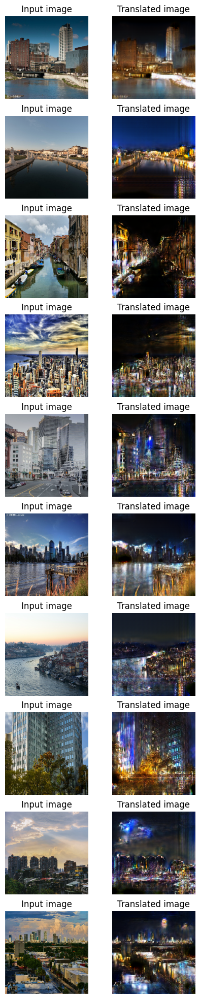

227/227 [==============================] - 54s 235ms/step - G_loss: 2.5474 - F_loss: 3.2388 - D_X_loss: 0.2149 - D_Y_loss: 0.0864
Epoch 101/200
227/227 [==============================] - 51s 223ms/step - G_loss: 2.5204 - F_loss: 3.3542 - D_X_loss: 0.2025 - D_Y_loss: 0.0844
Epoch 102/200
227/227 [==============================] - 51s 224ms/step - G_loss: 2.5072 - F_loss: 3.2017 - D_X_loss: 0.2091 - D_Y_loss: 0.0841
Epoch 103/200
227/227 [==============================] - 51s 223ms/step - G_loss: 2.4972 - F_loss: 3.1675 - D_X_loss: 0.2068 - D_Y_loss: 0.0846
Epoch 104/200
227/227 [==============================] - 51s 224ms/step - G_loss: 2.6030 - F_loss: 3.1861 - D_X_loss: 0.2124 - D_Y_loss: 0.0876
Epoch 105/200
227/227 [==============================] - 51s 223ms/step - G_loss: 2.5961 - F_loss: 3.2716 - D_X_loss: 0.2091 - D_Y_loss: 0.0850
Epoch 106/200
227/227 [==============================] - 53s 232ms/step - G_loss: 2.5452 - F_loss: 3.2940 - D_X_loss: 0.2114 - D_Y_loss: 0.0858
Epoch 

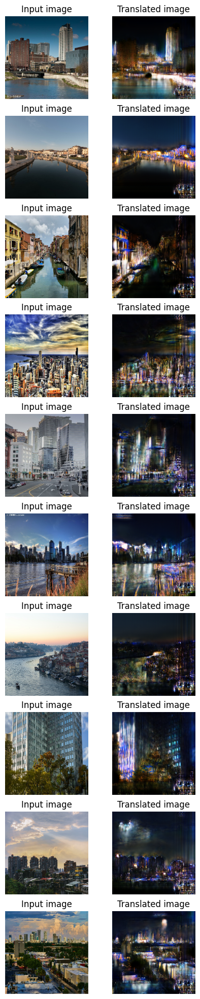

227/227 [==============================] - 54s 235ms/step - G_loss: 2.4968 - F_loss: 3.1728 - D_X_loss: 0.2157 - D_Y_loss: 0.0969
Epoch 121/200
227/227 [==============================] - 51s 223ms/step - G_loss: 2.5561 - F_loss: 3.1773 - D_X_loss: 0.2083 - D_Y_loss: 0.0922
Epoch 122/200
227/227 [==============================] - 51s 224ms/step - G_loss: 2.5177 - F_loss: 3.1402 - D_X_loss: 0.2084 - D_Y_loss: 0.0831
Epoch 123/200
227/227 [==============================] - 51s 223ms/step - G_loss: 2.5699 - F_loss: 3.0872 - D_X_loss: 0.2085 - D_Y_loss: 0.0802
Epoch 124/200
227/227 [==============================] - 51s 224ms/step - G_loss: 2.6026 - F_loss: 3.1201 - D_X_loss: 0.2112 - D_Y_loss: 0.0800
Epoch 125/200
227/227 [==============================] - 51s 223ms/step - G_loss: 2.5428 - F_loss: 3.1625 - D_X_loss: 0.2067 - D_Y_loss: 0.0795
Epoch 126/200
227/227 [==============================] - 51s 224ms/step - G_loss: 2.5359 - F_loss: 3.2348 - D_X_loss: 0.1988 - D_Y_loss: 0.0829
Epoch 

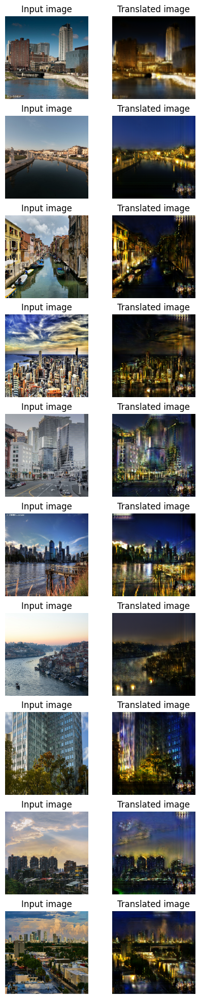

227/227 [==============================] - 53s 235ms/step - G_loss: 2.6030 - F_loss: 3.1262 - D_X_loss: 0.2022 - D_Y_loss: 0.0633
Epoch 141/200
227/227 [==============================] - 51s 223ms/step - G_loss: 2.6407 - F_loss: 3.1064 - D_X_loss: 0.2022 - D_Y_loss: 0.0672
Epoch 142/200
227/227 [==============================] - 51s 223ms/step - G_loss: 2.6286 - F_loss: 3.0515 - D_X_loss: 0.2070 - D_Y_loss: 0.0647
Epoch 143/200
227/227 [==============================] - 51s 223ms/step - G_loss: 2.6081 - F_loss: 3.1311 - D_X_loss: 0.1979 - D_Y_loss: 0.0686
Epoch 144/200
227/227 [==============================] - 51s 223ms/step - G_loss: 2.6947 - F_loss: 3.1368 - D_X_loss: 0.1985 - D_Y_loss: 0.0693
Epoch 145/200
227/227 [==============================] - 51s 223ms/step - G_loss: 2.5854 - F_loss: 3.1457 - D_X_loss: 0.2061 - D_Y_loss: 0.0625
Epoch 146/200
227/227 [==============================] - 51s 224ms/step - G_loss: 2.6081 - F_loss: 3.1276 - D_X_loss: 0.2053 - D_Y_loss: 0.0616
Epoch 

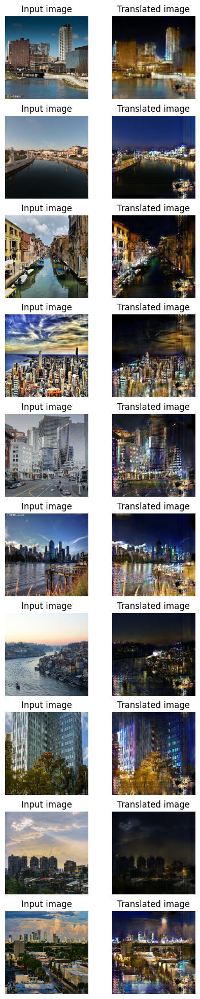

227/227 [==============================] - 53s 235ms/step - G_loss: 2.7019 - F_loss: 2.9120 - D_X_loss: 0.2071 - D_Y_loss: 0.0578
Epoch 161/200
227/227 [==============================] - 51s 223ms/step - G_loss: 2.6875 - F_loss: 3.0018 - D_X_loss: 0.2093 - D_Y_loss: 0.0630
Epoch 162/200
227/227 [==============================] - 51s 224ms/step - G_loss: 2.6465 - F_loss: 3.0086 - D_X_loss: 0.2075 - D_Y_loss: 0.0575
Epoch 163/200
227/227 [==============================] - 51s 223ms/step - G_loss: 2.7347 - F_loss: 3.0593 - D_X_loss: 0.2066 - D_Y_loss: 0.0578
Epoch 164/200
227/227 [==============================] - 51s 224ms/step - G_loss: 2.7102 - F_loss: 3.0220 - D_X_loss: 0.2050 - D_Y_loss: 0.0596
Epoch 165/200
227/227 [==============================] - 51s 224ms/step - G_loss: 2.7071 - F_loss: 3.1003 - D_X_loss: 0.2059 - D_Y_loss: 0.0575
Epoch 166/200
227/227 [==============================] - 51s 223ms/step - G_loss: 2.7128 - F_loss: 3.0630 - D_X_loss: 0.2013 - D_Y_loss: 0.0550
Epoch 

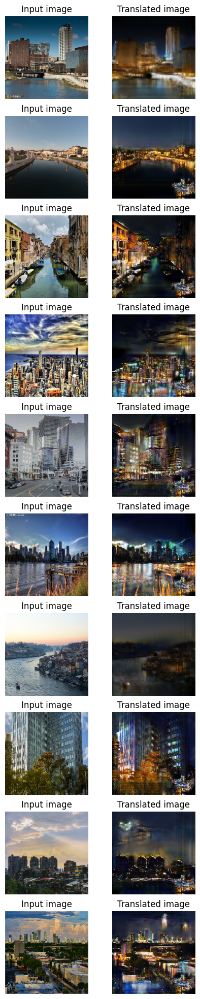

227/227 [==============================] - 54s 237ms/step - G_loss: 2.7294 - F_loss: 3.0503 - D_X_loss: 0.2079 - D_Y_loss: 0.0463
Epoch 181/200
227/227 [==============================] - 51s 224ms/step - G_loss: 2.6343 - F_loss: 3.0647 - D_X_loss: 0.1928 - D_Y_loss: 0.0548
Epoch 182/200
227/227 [==============================] - 51s 224ms/step - G_loss: 2.6574 - F_loss: 3.2795 - D_X_loss: 0.1720 - D_Y_loss: 0.0495
Epoch 183/200
227/227 [==============================] - 51s 224ms/step - G_loss: 2.6595 - F_loss: 3.0450 - D_X_loss: 0.1849 - D_Y_loss: 0.0502
Epoch 184/200
227/227 [==============================] - 51s 224ms/step - G_loss: 2.6747 - F_loss: 3.0404 - D_X_loss: 0.1905 - D_Y_loss: 0.0528
Epoch 185/200
227/227 [==============================] - 51s 224ms/step - G_loss: 2.6936 - F_loss: 2.9936 - D_X_loss: 0.1970 - D_Y_loss: 0.0509
Epoch 186/200
227/227 [==============================] - 51s 224ms/step - G_loss: 2.6985 - F_loss: 2.9687 - D_X_loss: 0.2023 - D_Y_loss: 0.0514
Epoch 

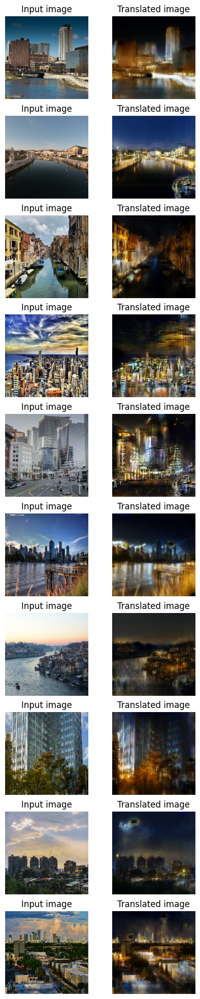

227/227 [==============================] - 54s 236ms/step - G_loss: 2.7177 - F_loss: 3.0603 - D_X_loss: 0.2061 - D_Y_loss: 0.0498


In [66]:
# Loss function for evaluating adversarial loss
adv_loss_fn = keras.losses.MeanSquaredError()

# Define the loss function for the generators
def generator_loss_fn(fake):
    fake_loss = adv_loss_fn(tf.ones_like(fake), fake)
    return fake_loss


# Define the loss function for the discriminators
def discriminator_loss_fn(real, fake):
    real_loss = adv_loss_fn(tf.ones_like(real), real)
    fake_loss = adv_loss_fn(tf.zeros_like(fake), fake)
    return (real_loss + fake_loss) * 0.5


# Create cycle gan model
cycle_gan_model = CycleGan(
    generator_G=gen_G, generator_F=gen_F, discriminator_X=disc_X, discriminator_Y=disc_Y
)

# Compile the model
cycle_gan_model.compile(
    gen_G_optimizer=keras.optimizers.legacy.Adam(learning_rate=2e-4, beta_1=0.5),
    gen_F_optimizer=keras.optimizers.legacy.Adam(learning_rate=2e-4, beta_1=0.5),
    disc_X_optimizer=keras.optimizers.legacy.Adam(learning_rate=2e-4, beta_1=0.5),
    disc_Y_optimizer=keras.optimizers.legacy.Adam(learning_rate=2e-4, beta_1=0.5),
    gen_loss_fn=generator_loss_fn,
    disc_loss_fn=discriminator_loss_fn,
)
# Callbacks
plotter = GANMonitor()
checkpoint_filepath = "./model_checkpoints/cyclegan_checkpoints.{epoch:03d}"
model_checkpoint_callback = keras.callbacks.ModelCheckpoint(
    filepath=checkpoint_filepath, save_weights_only=True
)

# Here we will train the model for just one epoch as each epoch takes around
# 7 minutes on a single P100 backed machine.
cycle_gan_model.fit(
    tf.data.Dataset.zip((day_train_dataset, night_train_dataset)),
    epochs=200,
    callbacks=[plotter, model_checkpoint_callback],
)